In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cv2
import PIL
import os
import sys
import glob
import random

from pprint import pprint
from ipywidgets import Video

from PIL import Image
from PIL.ExifTags import TAGS

In [2]:
anymal = cv2.VideoCapture("./videos/gameplay.mkv")
if anymal.isOpened():
    print("Video loaded")

anymal_width = int(anymal.get(3))
anymal_height = int(anymal.get(4))

print(anymal_height, anymal_width)

anymal_fps = anymal.get(cv2.CAP_PROP_FPS)
print(anymal_fps)

Video loaded
720 1152
60.0


In [3]:
anymal.release()

In [5]:
vv = cv2.VideoCapture("./videos/gameplay.mkv")
if vv.isOpened():
    print("Video loaded")

vv_width = int(vv.get(3))
vv_height = int(vv.get(4))

print(vv_height, vv_width)

vv_fps = vv.get(cv2.CAP_PROP_FPS)
print(vv_fps)

Video loaded
720 1152
60.0


In [7]:
def draw_bbox(frame, bbox, color=(255, 255, 255)):
    p1 = (int(bbox[0]), int(bbox[1]))
    p2 = (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3]))
    cv2.rectangle(frame, p1, p2, color, 2, 1)

In [8]:
def imshow(a):
    a = a.clip(0, 255).astype("uint8")
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    display(PIL.Image.fromarray(a))

In [9]:
def create_tracker(tracker_type):
    tracker_types = [
        "BOOSTING",
        "MIL",
        "KCF",
        "TLD",
        "MEDIANFLOW",
        "MOSSE",
        "CSRT",
    ]
    if tracker_type == 'BOOSTING':
        tracker = cv2.legacy.TrackerBoosting_create()
    if tracker_type == 'MIL':
        tracker = cv2.TrackerMIL_create()
    if tracker_type == 'KCF':
        tracker = cv2.TrackerKCF_create()
    if tracker_type == 'TLD':
        tracker = cv2.legacy.TrackerTLD_create()
    if tracker_type == 'MEDIANFLOW':
        tracker = cv2.legacy.TrackerMedianFlow_create()
    if tracker_type == 'MOSSE':
        tracker = cv2.legacy.TrackerMOSSE_create()
    if tracker_type == "CSRT":
        tracker = cv2.TrackerCSRT_create()
    return tracker

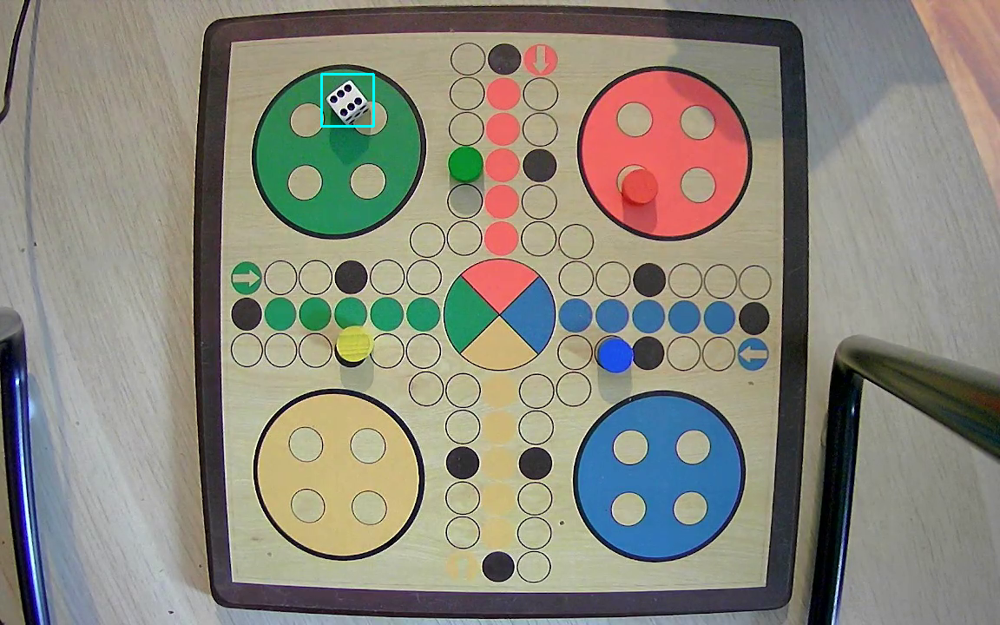

In [10]:
vv.set(cv2.CAP_PROP_POS_FRAMES, 200)
ret, frame = vv.read()

# player_bbox = (190, 260, 70, 100)
cube_bbox = (370, 85, 60, 60)

# draw_bbox(frame, player_bbox, (255, 0, 0))
draw_bbox(frame, cube_bbox, (255, 255, 0))

imshow(frame)

In [11]:
vv.set(cv2.CAP_PROP_POS_FRAMES, 200)
ret, frame = vv.read()

cube_bbox = (370, 85, 60, 60)

cube_tracker = create_tracker("MIL")
# gkeeper_tracker = create_tracker("CSRT")

if cube_tracker.init(frame, cube_bbox):
    print("Player tracking algorithm initiated at point:", cube_bbox)

# if gkeeper_tracker.init(frame, gkeeper_bbox):
#     print("Goalkeeper tracking algorithm initiated at point:", gkeeper_bbox)

free_kick_track = cv2.VideoWriter(
    "./free_kick_track.avi",
    cv2.VideoWriter_fourcc(*"DIVX"),
    vv_fps,
    (vv_width, vv_height),
)

vv.set(cv2.CAP_PROP_POS_FRAMES, 200)
while vv.isOpened():
    ret, frame = vv.read()

    if ret:
        ok, bbox = cube_tracker.update(frame)
        if ok:
            draw_bbox(frame, bbox, (0, 0, 255))


        free_kick_track.write(frame)
    else:
        break

free_kick_track.release()

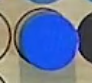

In [12]:
template = cv2.imread("./fotos/counter.png", cv2.IMREAD_COLOR)
_, w, h = template.shape[::-1]

imshow(template)

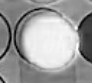

In [13]:
# get only blue channel of the image
template = template[:, :, 0]
imshow(template)

In [14]:
vv.set(cv2.CAP_PROP_POS_FRAMES, 200)
ret, frame = vv.read()

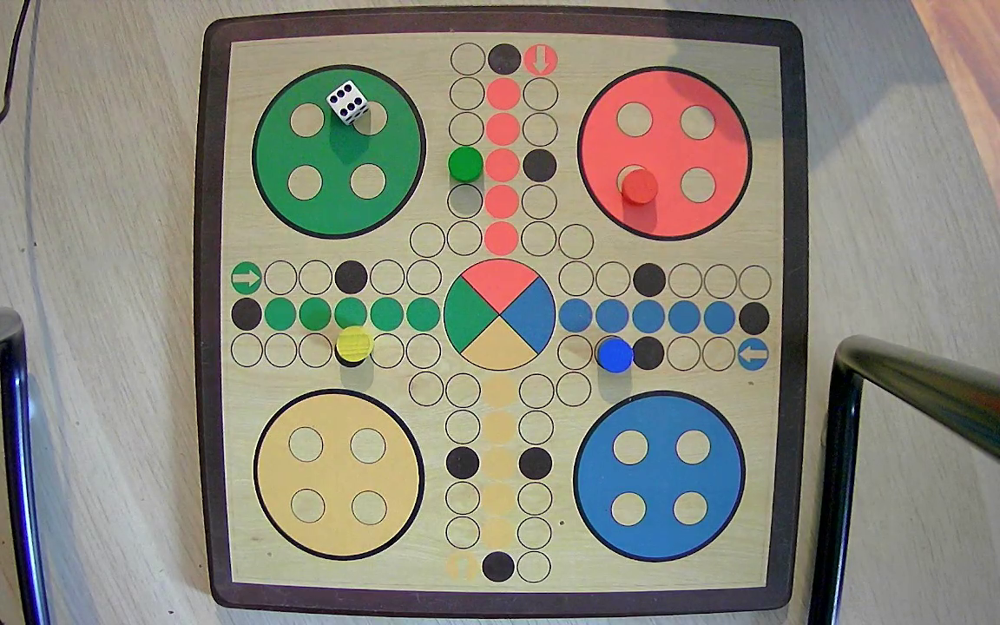

In [15]:
imshow(frame)

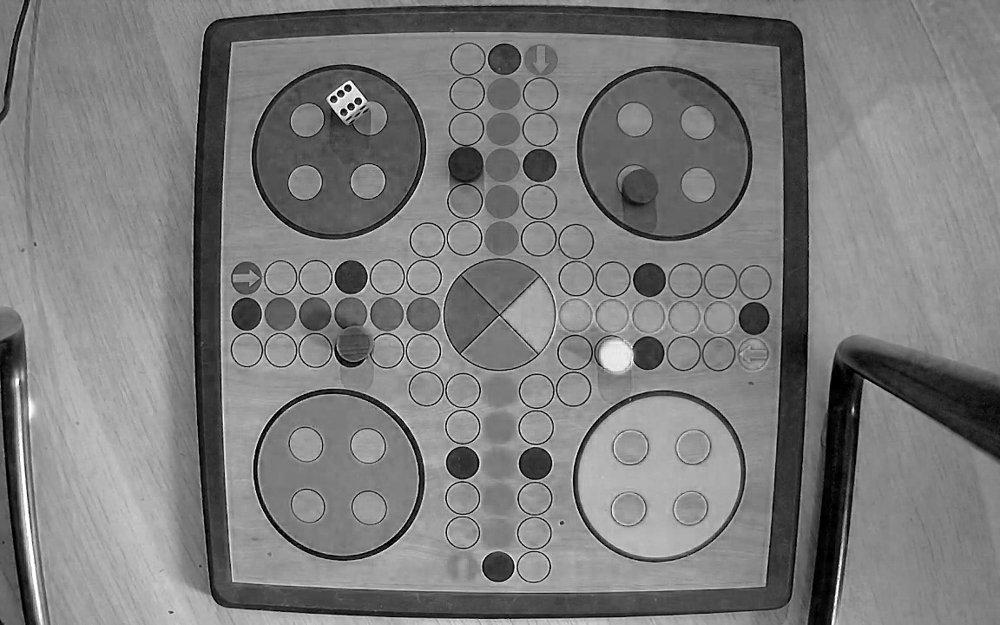

In [16]:
# get only blue values from frame
frame_blue = frame[:, :, 0]
imshow(frame_blue)

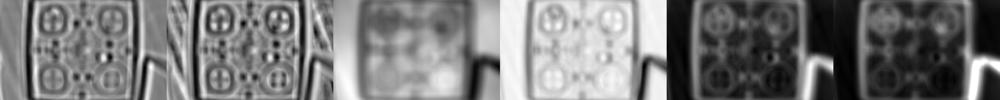

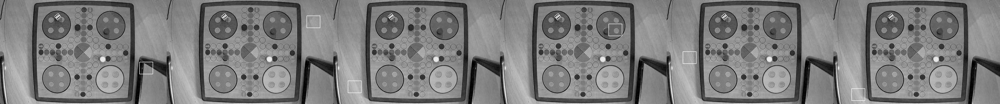

In [17]:
methods = [
    cv2.TM_CCOEFF,
    cv2.TM_CCOEFF_NORMED,
    cv2.TM_CCORR,
    cv2.TM_CCORR_NORMED,
    cv2.TM_SQDIFF,
    cv2.TM_SQDIFF_NORMED,
]
pleng = frame_blue.copy()
pleng_template = template.copy()
results_rgb = []
results_prob = []
for method in methods:
    _pleng = pleng.copy()
    # Apply template Matching
    res = cv2.matchTemplate(_pleng, pleng_template, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv2.rectangle(_pleng, top_left, bottom_right, (255, 0, 0), 2)

    results_rgb.append(_pleng)
    results_prob.append((res - res.min()) * 255 / (res.max() - res.min()))

imshow(np.concatenate(results_prob, 1))
imshow(np.concatenate(results_rgb, 1))

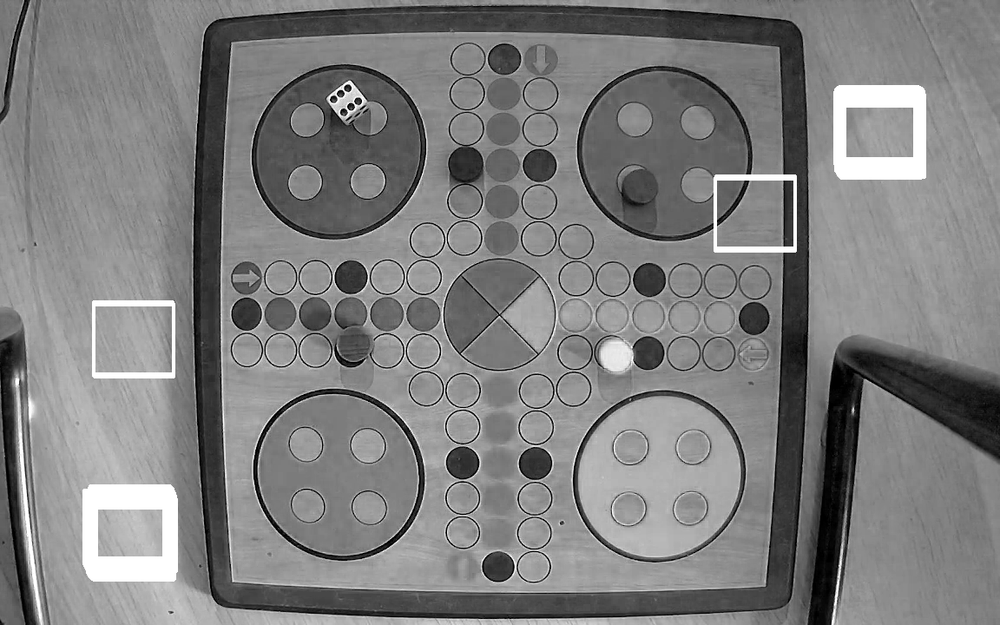

In [18]:
_pleng = pleng.copy()

res = cv2.matchTemplate(_pleng, pleng_template, cv2.TM_CCOEFF_NORMED)
loc = np.where(res >= 0.5)
for pt in zip(*loc[::-1]):
    cv2.rectangle(_pleng, pt, (pt[0] + w, pt[1] + h), (255, 0, 0), 2)

imshow(_pleng)


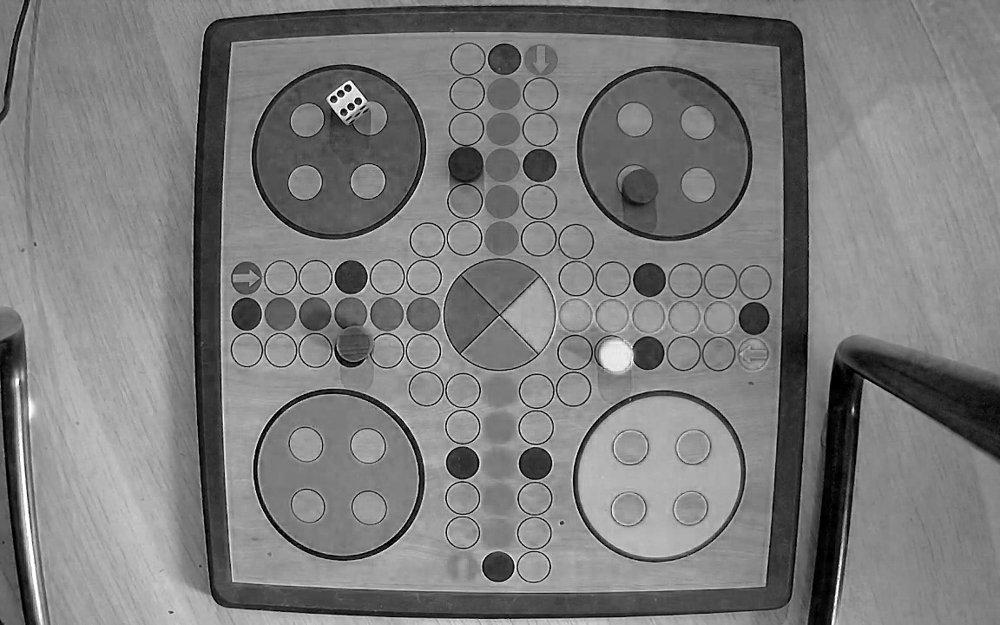

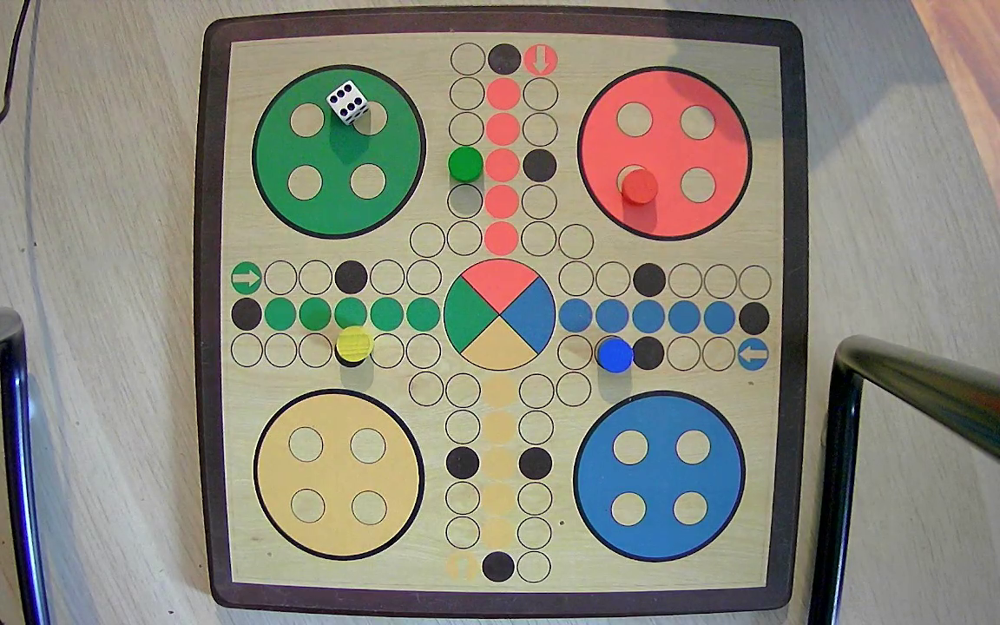

In [20]:
# applay hoghcircles on blue_frame to detect the ciurcle
blue_frame = frame[:, :, 0].copy()
imshow(blue_frame)

circles = cv2.HoughCircles(
    blue_frame,
    cv2.HOUGH_GRADIENT,
    dp=1,
    minDist=10,
    param1=500,
    param2=300,
    minRadius=5,
    maxRadius=10,
)

if circles is not None:
    circles = np.uint16(np.around(circles))
    for i in circles[0, :]:
        cv2.circle(frame, (i[0], i[1]), i[2], (0, 255, 0), 2)
        cv2.circle(frame, (i[0], i[1]), 2, (0, 0, 255), 3)

imshow(frame)


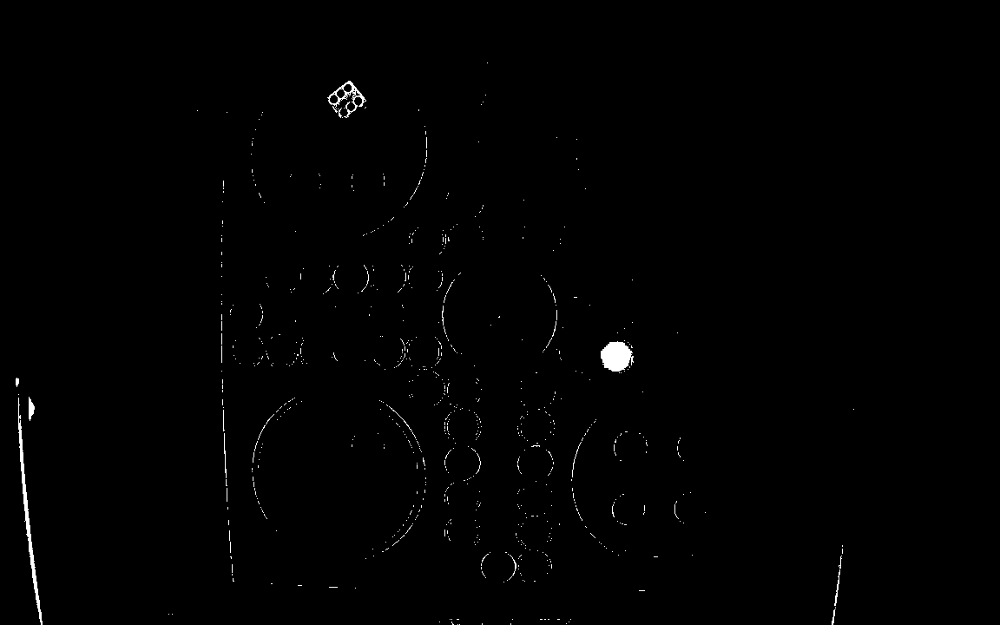

In [21]:
# applay tresholding to detect the circle
_, thresh = cv2.threshold(blue_frame, 210, 255, cv2.THRESH_BINARY)
imshow(thresh)

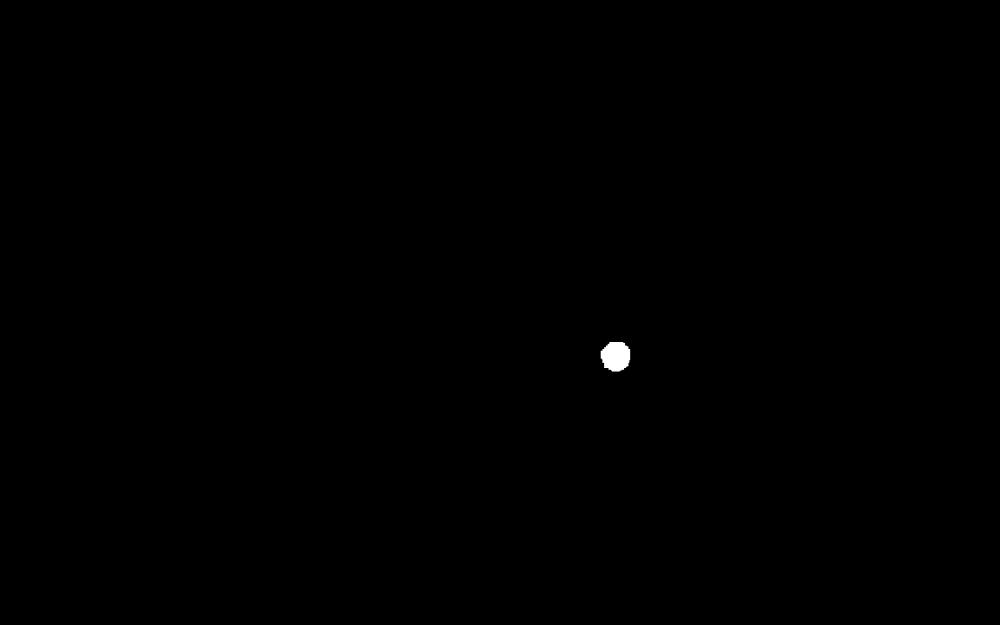

In [22]:
# applay morphological opening operations to detect the circle
kernel = np.ones((5, 5), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
imshow(opening)

In [23]:
vv.set(cv2.CAP_PROP_POS_FRAMES, 200)
ret, frame = vv.read()

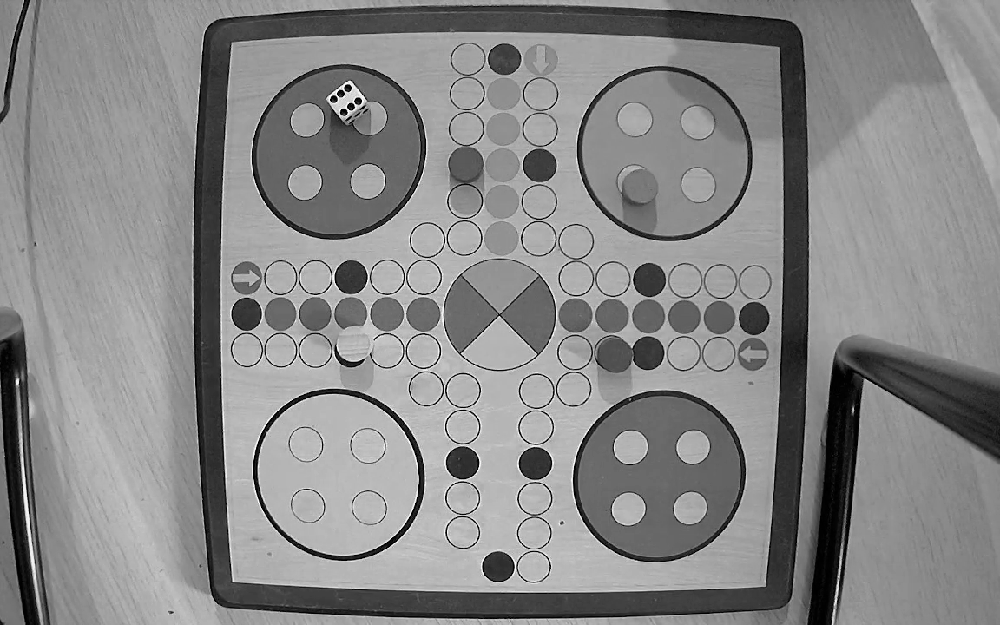

In [24]:
# frame to gray scale
gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
imshow(gray_frame)

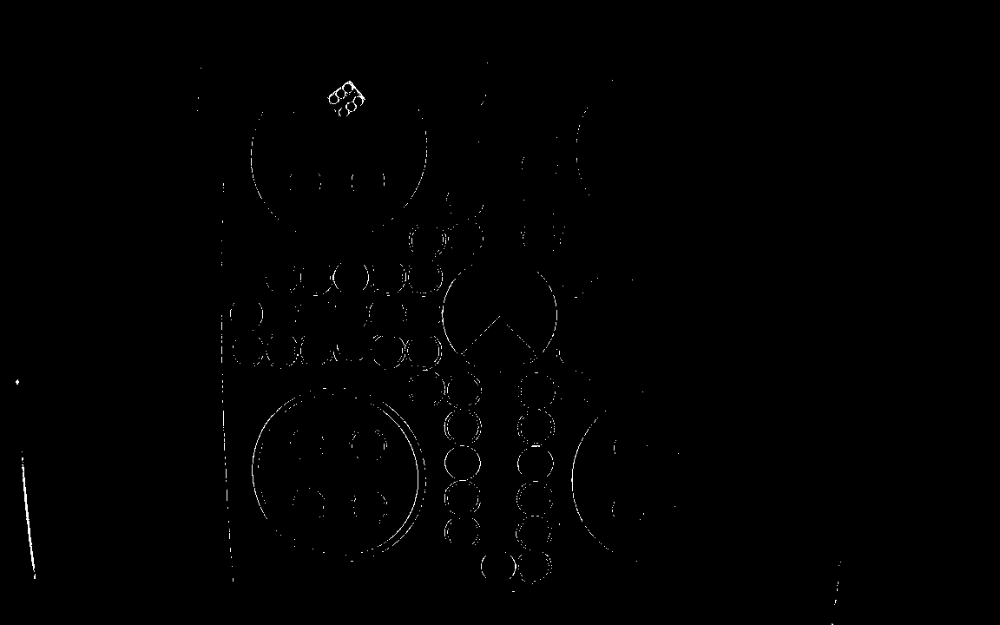

In [25]:
# applay tresholding to detect the cube
_, thresh = cv2.threshold(gray_frame, 225, 255, cv2.THRESH_BINARY)
imshow(thresh)

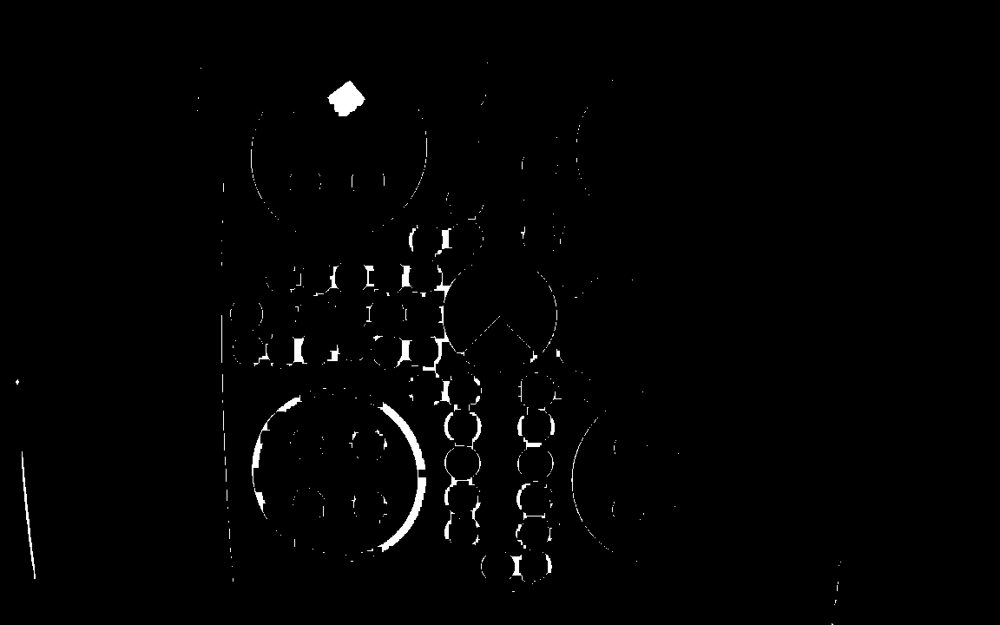

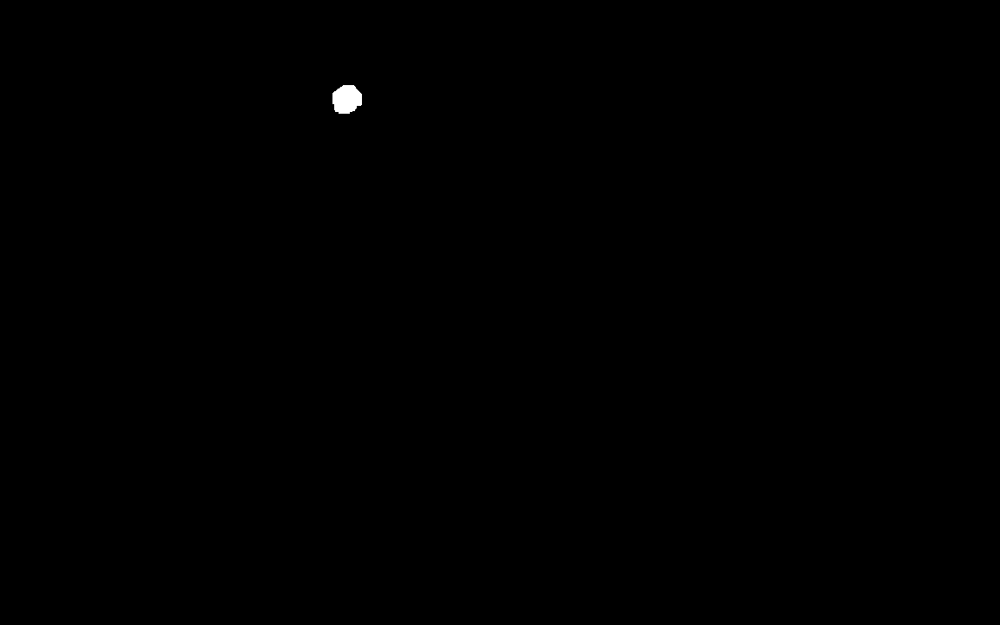

In [26]:
# applay morphological opening operations to detect the cube
kernel = np.ones((5, 5), np.uint8)
# first colsing
closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
imshow(closing)
kernel = np.ones((5, 5), np.uint8)
opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel, iterations=3)
imshow(opening)

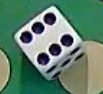

In [27]:
template = cv2.imread("./fotos/cube.png", cv2.IMREAD_COLOR)
_, w, h = template.shape[::-1]

imshow(template)

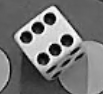

In [28]:
gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
imshow(gray_template)

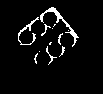

In [29]:
_, thresh = cv2.threshold(gray_template, 225, 255, cv2.THRESH_BINARY)
imshow(thresh)

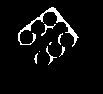

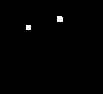

In [30]:
kernel = np.ones((5, 5), np.uint8)
# first colsing
closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)
imshow(closing)
kernel = np.ones((5, 5), np.uint8)
opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel, iterations=1)
imshow(opening)

In [31]:
vv.set(cv2.CAP_PROP_POS_FRAMES, 200)
ret, frame = vv.read()

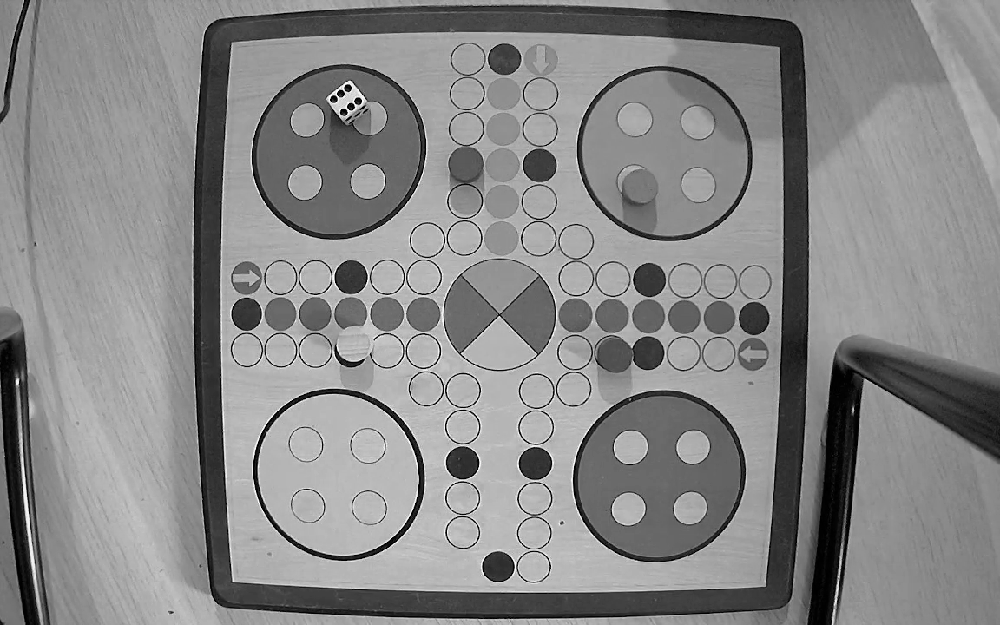

In [32]:
gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
imshow(gray_frame)

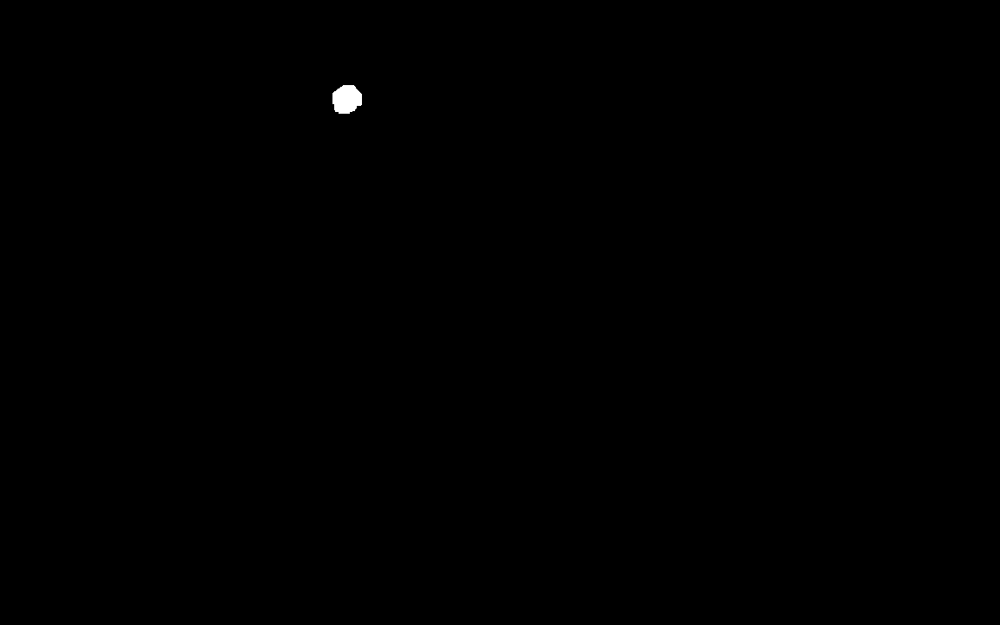

In [33]:
_, thresh = cv2.threshold(gray_frame, 225, 255, cv2.THRESH_BINARY)
# imshow(thresh)
kernel = np.ones((5, 5), np.uint8)
# first colsing
closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
# imshow(closing)
kernel = np.ones((5, 5), np.uint8)
opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel, iterations=3)
# imshow(opening)
op_frame = opening.copy()
imshow(op_frame)

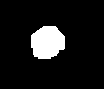

In [34]:
template = cv2.imread("./fotos/mask.png", cv2.IMREAD_COLOR)
_, w, h = template.shape[::-1]

imshow(template)

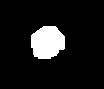

In [35]:
# convert binary to grayscale
gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

# apply thresholding
_, thresh_template = cv2.threshold(gray_template, 225, 255, cv2.THRESH_BINARY)
imshow(thresh_template)

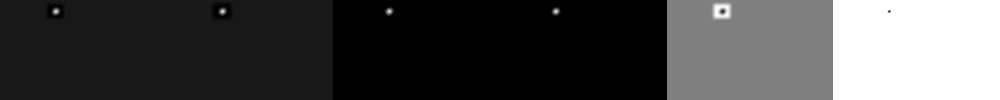

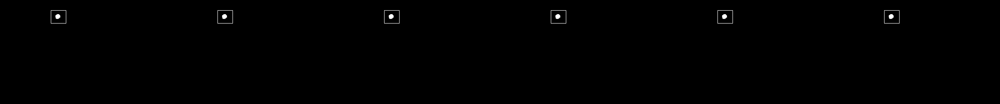

In [36]:
methods = [
    cv2.TM_CCOEFF,
    cv2.TM_CCOEFF_NORMED,
    cv2.TM_CCORR,
    cv2.TM_CCORR_NORMED,
    cv2.TM_SQDIFF,
    cv2.TM_SQDIFF_NORMED,
]
pleng = op_frame.copy()
pleng_template = thresh_template.copy()
results_rgb = []
results_prob = []
for method in methods:
    _pleng = pleng.copy()
    # Apply template Matching
    res = cv2.matchTemplate(_pleng, pleng_template, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv2.rectangle(_pleng, top_left, bottom_right, (255, 0, 0), 2)

    results_rgb.append(_pleng)
    results_prob.append((res - res.min()) * 255 / (res.max() - res.min()))

imshow(np.concatenate(results_prob, 1))
imshow(np.concatenate(results_rgb, 1))

In [108]:
vv.set(cv2.CAP_PROP_POS_FRAMES, 200)
ret, frame = vv.read()
template = cv2.imread("./fotos/mask.png", cv2.IMREAD_COLOR)
_, w, h = template.shape[::-1]
gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

# apply thresholding
_, thresh_template = cv2.threshold(gray_template, 225, 255, cv2.THRESH_BINARY)

cube_bbox = (370, 85, 60, 60)

cube_tracker = create_tracker("MIL")
# gkeeper_tracker = create_tracker("CSRT")

if cube_tracker.init(frame, cube_bbox):
    print("Player tracking algorithm initiated at point:", cube_bbox)

# if gkeeper_tracker.init(frame, gkeeper_bbox):
#     print("Goalkeeper tracking algorithm initiated at point:", gkeeper_bbox)

free_kick_track = cv2.VideoWriter(
    "./cube.avi",
    cv2.VideoWriter_fourcc(*"DIVX"),
    vv_fps,
    (w, h),
)

vv.set(cv2.CAP_PROP_POS_FRAMES, 200)
while vv.isOpened():
    ret, frame = vv.read()
    
    if ret:
       
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray_frame, 225, 255, cv2.THRESH_BINARY)
        # imshow(thresh)
        kernel = np.ones((5, 5), np.uint8)
        # first colsing
        closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
        # imshow(closing)
        kernel = np.ones((5, 5), np.uint8)
        opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel, iterations=3)
        # imshow(opening)
        op_frame = opening.copy()

       
        _pleng = op_frame.copy()
        # Apply template Matching
        res = cv2.matchTemplate(_pleng, pleng_template, cv2.TM_CCOEFF)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
        if cv2.TM_CCOEFF in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
            top_left = min_loc
        else:
            top_left = max_loc
        bottom_right = (top_left[0] + w, top_left[1] + h)
        cv2.rectangle(frame, top_left, bottom_right, (255, 0, 0), 2)

        # crop the detected cube
        cube = frame[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]


        # results_rgb.append(_pleng)
        # results_prob.append((res - res.min()) * 255 / (res.max() - res.min()))
       


        free_kick_track.write(cube)
    else:
        break

free_kick_track.release()

In [192]:
vv = cv2.VideoCapture("./videos/cube.avi")
if vv.isOpened():
    print("Video loaded")

vv_width = int(vv.get(3))
vv_height = int(vv.get(4))

print(vv_height, vv_width)

vv_fps = vv.get(cv2.CAP_PROP_FPS)
print(vv_fps)



Video loaded
88 104
60.0


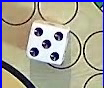

In [193]:
vv.set(cv2.CAP_PROP_POS_FRAMES, 500)
ret, frame = vv.read()
imshow(frame)

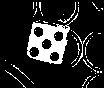

In [208]:
gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(gray_frame, 210, 255, cv2.THRESH_BINARY)
imshow(thresh)

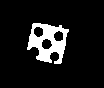

In [197]:
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)
imshow(opening)

In [198]:
cnts = cv2.findContours(opening, cv2.RETR_LIST, 
                    cv2.CHAIN_APPROX_SIMPLE)[-2] 

In [206]:
s1 = 1
s2 = 100000000000
xcnts = [] 
for cnt in cnts: 
    if s1<cv2.contourArea(cnt) <s2: 
        xcnts.append(cnt)


print("\nDots number: {}".format(len(xcnts))) 



Dots number: 4


Video loaded
88 104
60.0


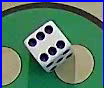


Dots number: 15


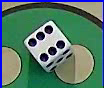


Dots number: 13


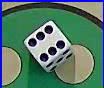


Dots number: 9


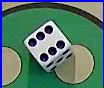


Dots number: 8


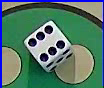


Dots number: 10


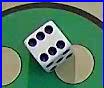


Dots number: 10


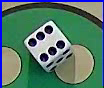


Dots number: 12


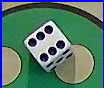


Dots number: 11


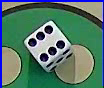


Dots number: 10


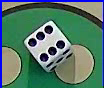


Dots number: 10


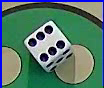


Dots number: 10


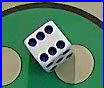


Dots number: 9


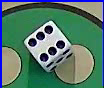


Dots number: 12


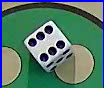


Dots number: 11


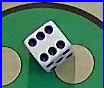


Dots number: 8


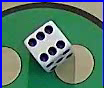


Dots number: 7


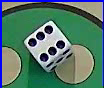


Dots number: 7


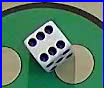


Dots number: 7


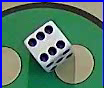


Dots number: 6


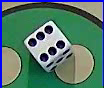


Dots number: 4


In [212]:
vv = cv2.VideoCapture("./videos/cube.avi")
if vv.isOpened():
    print("Video loaded")

vv_width = int(vv.get(3))
vv_height = int(vv.get(4))

print(vv_height, vv_width)

vv_fps = vv.get(cv2.CAP_PROP_FPS)
print(vv_fps)
step = 0
while vv.isOpened():
    step+=1
    ret, frame = vv.read()
    imshow(frame)
    if ret:
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray_frame, 210, 255, cv2.THRESH_BINARY)
        # kernel = np.ones((5, 5), np.uint8)
        # opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)
        cnts = cv2.findContours(thresh, cv2.RETR_LIST, 
                    cv2.CHAIN_APPROX_SIMPLE)[-2] 
        s1 = 1
        s2 = 3
        xcnts = [] 
        for cnt in cnts: 
            if s1<cv2.contourArea(cnt) <s2: 
                xcnts.append(cnt)
        print("\nDots number: {}".format(len(xcnts)))
        if step == 20:
            break
    else:
        break

vv.release()
